<a href="https://colab.research.google.com/github/sileysa/PCVK26_26_SILEYSA/blob/main/Week5_26.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sel Identitas — WAJIB paling atas

NAMA : Sileysa Faedatul Nuraini
NIM : 244107020231 | N = 231
bins   : 64
clip   : 1.5
tile   : 5
L      : 2
WAKTU : 2026-09-23 14:11:16 WIB
SISTEM : 3.13.15 Linux-6.6.122+-x86_64-with-glibc2.39
TOKEN : d2cf5d3e22508717


Text(0.5, 1.0, '244107020231 - CLAHE clip 1.5')

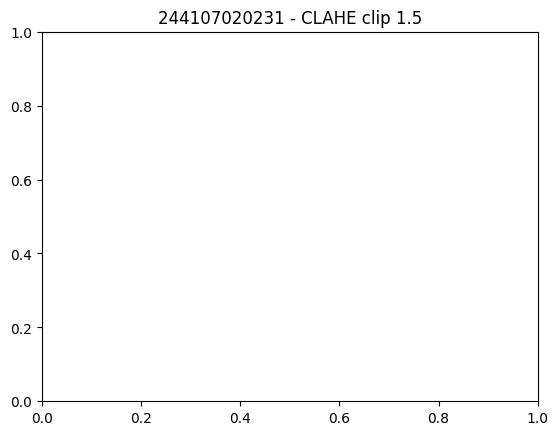

In [85]:
# ===== SEL IDENTITAS - JANGAN DIHAPUS, HARUS SEL PERTAMA =====
import sys, platform, hashlib, datetime, zoneinfo
import matplotlib.pyplot as plt

NAMA = 'Sileysa Faedatul Nuraini'
NIM = '244107020231'

N = int(NIM[-3:])

PARAM = {
    'bins': 2 ** ((N % 4) + 3),
    'clip': round(1.0 + (N % 5) * 0.5, 1),
    'tile': (N % 4) + 2,
    'L'   : 2 ** ((N % 3) + 1),
}

waktu = datetime.datetime.now(zoneinfo.ZoneInfo('Asia/Jakarta'))

print('NAMA :', NAMA)
print('NIM :', NIM, '| N =', N)

for k, v in PARAM.items():
    print('%-6s :' % k, v)

print('WAKTU :', waktu.strftime('%Y-%m-%d %H:%M:%S %Z'))
print('SISTEM :', sys.version.split()[0], platform.platform())

kunci = NIM + '|' + waktu.strftime('%Y-%m-%d')
print('TOKEN :', hashlib.sha256(kunci.encode()).hexdigest()[:16])
plt.title(NIM + ' - CLAHE clip ' + str(PARAM['clip']))

# Hubungkan Google Drive

In [86]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Import library

In [87]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import math
import os
import glob

In [88]:
CONTOH = '/content/drive/MyDrive/PCVK/Images'
BASE = '/content/drive/MyDrive/PCVK/Images/' + NIM

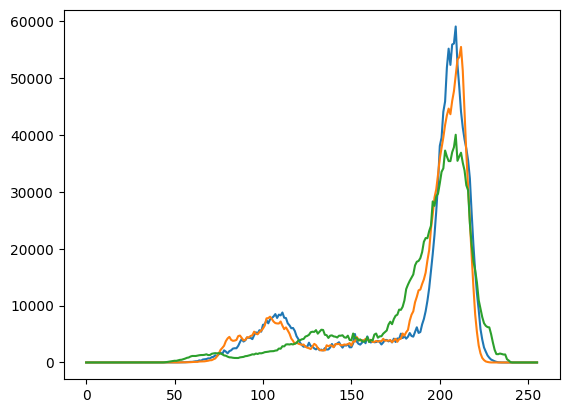

In [89]:
import numpy as np, cv2 as cv, matplotlib.pyplot as plt

def histogram_manual(img, L=256):
    h = np.zeros(L, dtype=np.int64)     # 1. siapkan penghitung, isi 0
    for y in range(img.shape[0]):       # 2. telusuri setiap baris
      for x in range(img.shape[1]):     # dan setiap kolom
          h[img[y, x]] += 1             # 3. tambah 1 sesuai nilai piksel
    return h

gray = cv.imread(BASE + '/KTP1b.jpg', cv.IMREAD_GRAYSCALE)
h = histogram_manual(gray)
p = h / gray.size                       # 4. normalisasi, jumlahnya = 1
cdf = np.cumsum(p)                      # 5. distribusi kumulatif
assert h.sum() == gray.size             # pemeriksaan wajib

# citra berwarna: ulangi untuk tiap kanal
bgr = cv.imread(BASE + '/KTP1d.jpg')
for i, nama in enumerate(['Biru', 'Hijau', 'Merah']):
    plt.plot(histogram_manual(bgr[:, :, i]), label=nama)

# E-1 PERCOBAAN HISTOGRAM

# Buat fungsi histogram manual (Lena.jpg)

<BarContainer object of 256 artists>

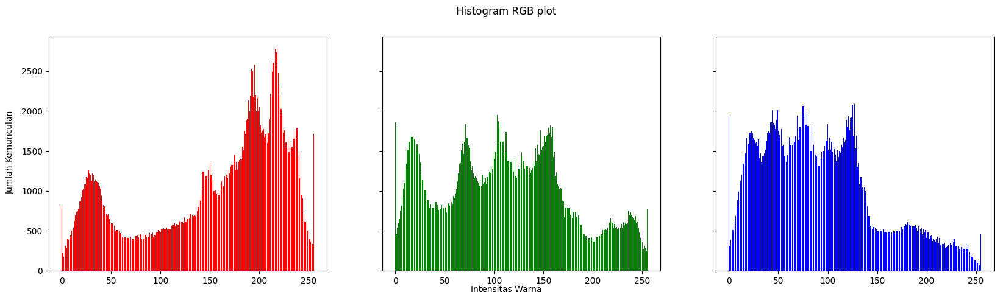

In [90]:
# membuat histogram image (manual)
img = cv.imread('/content/drive/MyDrive/PCVK/Images/lena.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

height, width, depth = np.shape(img)
names = np.arange(256)

red = [0]*256
green = [0]*256
blue = [0]*256

for y in range(0,height):
    for x in range(0,width):
        red[img[y][x][0]] += 1
        green[img[y][x][1]] += 1
        blue[img[y][x][2]] += 1

names = np.arange(256)

fig, axs = plt.subplots(1, 3, figsize=(20,5), sharex=True, sharey=True)
fig.suptitle('Histogram RGB plot')
fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')

axs[0].bar(names, red, color='red')
axs[1].bar(names, green, color='green')
axs[2].bar(names, blue, color='blue')

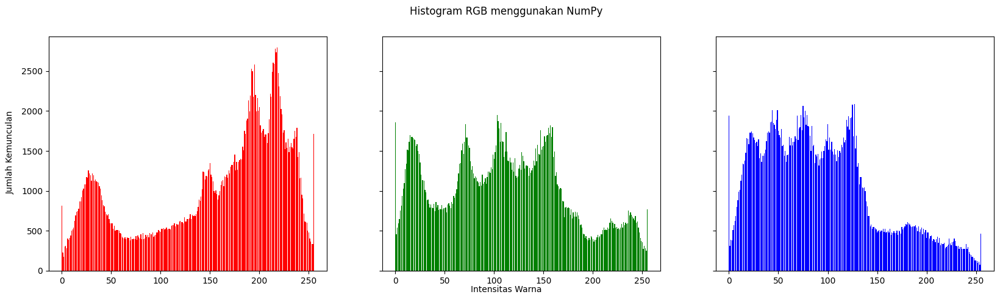

In [91]:
# Histogram menggunakan NumPy

hist_red_np, _ = np.histogram(
    img[:, :, 0],
    bins=256,
    range=(0, 256)
)

hist_green_np, _ = np.histogram(
    img[:, :, 1],
    bins=256,
    range=(0, 256)
)

hist_blue_np, _ = np.histogram(
    img[:, :, 2],
    bins=256,
    range=(0, 256)
)

# Menampilkan histogram NumPy
fig, axs = plt.subplots(
    1, 3,
    figsize=(20, 5),
    sharex=True,
    sharey=True
)

fig.suptitle('Histogram RGB menggunakan NumPy')
fig.text(
    0.09, 0.5,
    'Jumlah Kemunculan',
    va='center',
    rotation='vertical'
)
fig.text(
    0.5, 0.04,
    'Intensitas Warna',
    ha='center'
)

axs[0].bar(names, hist_red_np, color='red')
axs[1].bar(names, hist_green_np, color='green')
axs[2].bar(names, hist_blue_np, color='blue')

plt.show()

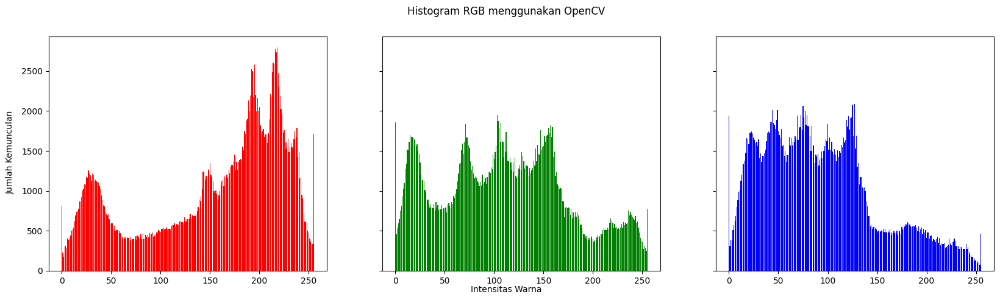

In [92]:
# Histogram menggunakan OpenCV

hist_red_cv = cv.calcHist(
    [img], [0], None, [256], [0, 256]
).flatten()

hist_green_cv = cv.calcHist(
    [img], [1], None, [256], [0, 256]
).flatten()

hist_blue_cv = cv.calcHist(
    [img], [2], None, [256], [0, 256]
).flatten()

# Menampilkan histogram OpenCV
fig, axs = plt.subplots(
    1, 3,
    figsize=(20, 5),
    sharex=True,
    sharey=True
)

fig.suptitle('Histogram RGB menggunakan OpenCV')
fig.text(
    0.09, 0.5,
    'Jumlah Kemunculan',
    va='center',
    rotation='vertical'
)
fig.text(
    0.5, 0.04,
    'Intensitas Warna',
    ha='center'
)

axs[0].bar(names, hist_red_cv, color='red')
axs[1].bar(names, hist_green_cv, color='green')
axs[2].bar(names, hist_blue_cv, color='blue')

plt.show()

In [93]:
# Membandingkan hasil histogram

print('=== PERBANDINGAN HISTOGRAM LENA.JPG ===')

print('\nManual vs NumPy')
print('Red   :', np.max(np.abs(np.array(red) - hist_red_np)))
print('Green :', np.max(np.abs(np.array(green) - hist_green_np)))
print('Blue  :', np.max(np.abs(np.array(blue) - hist_blue_np)))

print('\nManual vs OpenCV')
print('Red   :', np.max(np.abs(np.array(red) - hist_red_cv)))
print('Green :', np.max(np.abs(np.array(green) - hist_green_cv)))
print('Blue  :', np.max(np.abs(np.array(blue) - hist_blue_cv)))

print('\nNumPy vs OpenCV')
print('Red   :', np.max(np.abs(hist_red_np - hist_red_cv)))
print('Green :', np.max(np.abs(hist_green_np - hist_green_cv)))
print('Blue  :', np.max(np.abs(hist_blue_np - hist_blue_cv)))

=== PERBANDINGAN HISTOGRAM LENA.JPG ===

Manual vs NumPy
Red   : 0
Green : 0
Blue  : 0

Manual vs OpenCV
Red   : 0.0
Green : 0.0
Blue  : 0.0

NumPy vs OpenCV
Red   : 0.0
Green : 0.0
Blue  : 0.0


# Buat fungsi histogram manual (KTP1b.jpg)

<BarContainer object of 256 artists>

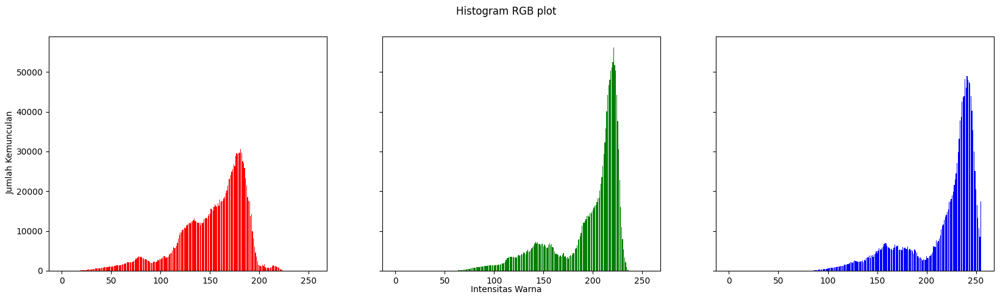

In [94]:
# membuat histogram image (manual)
img = cv.imread('/content/drive/MyDrive/PCVK/Images/244107020231/KTP1b.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

height, width, depth = np.shape(img)
names = np.arange(256)

red = [0]*256
green = [0]*256
blue = [0]*256

for y in range(0,height):
    for x in range(0,width):
        red[img[y][x][0]] += 1
        green[img[y][x][1]] += 1
        blue[img[y][x][2]] += 1

names = np.arange(256)

fig, axs = plt.subplots(1, 3, figsize=(20,5), sharex=True, sharey=True)
fig.suptitle('Histogram RGB plot')
fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')

axs[0].bar(names, red, color='red')
axs[1].bar(names, green, color='green')
axs[2].bar(names, blue, color='blue')

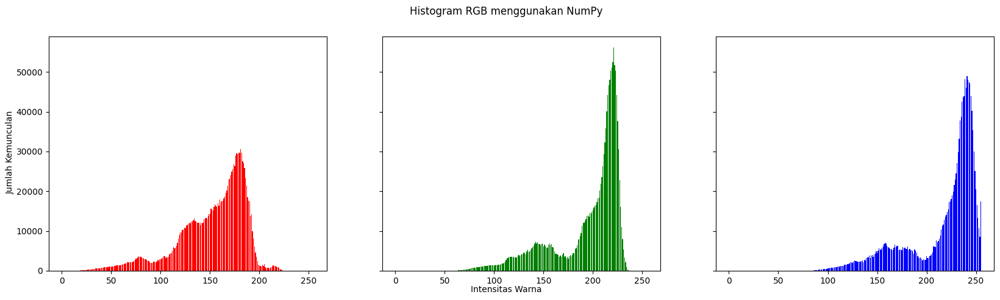

In [95]:
# Histogram menggunakan NumPy

hist_red_np, _ = np.histogram(
    img[:, :, 0],
    bins=256,
    range=(0, 256)
)

hist_green_np, _ = np.histogram(
    img[:, :, 1],
    bins=256,
    range=(0, 256)
)

hist_blue_np, _ = np.histogram(
    img[:, :, 2],
    bins=256,
    range=(0, 256)
)

# Menampilkan histogram NumPy
fig, axs = plt.subplots(
    1, 3,
    figsize=(20, 5),
    sharex=True,
    sharey=True
)

fig.suptitle('Histogram RGB menggunakan NumPy')
fig.text(
    0.09, 0.5,
    'Jumlah Kemunculan',
    va='center',
    rotation='vertical'
)
fig.text(
    0.5, 0.04,
    'Intensitas Warna',
    ha='center'
)

axs[0].bar(names, hist_red_np, color='red')
axs[1].bar(names, hist_green_np, color='green')
axs[2].bar(names, hist_blue_np, color='blue')

plt.show()

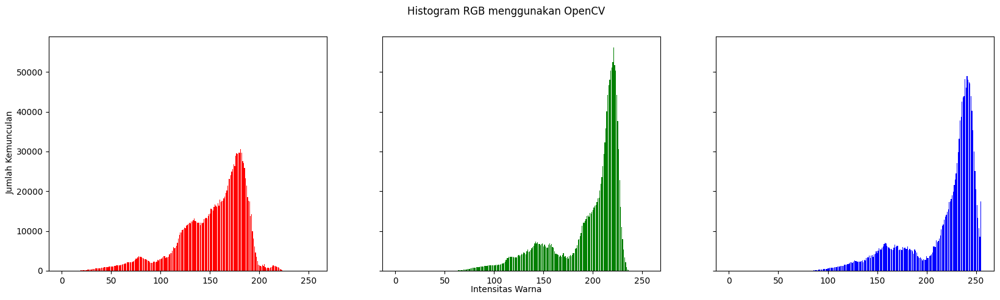

In [96]:
# Histogram menggunakan OpenCV

hist_red_cv = cv.calcHist(
    [img], [0], None, [256], [0, 256]
).flatten()

hist_green_cv = cv.calcHist(
    [img], [1], None, [256], [0, 256]
).flatten()

hist_blue_cv = cv.calcHist(
    [img], [2], None, [256], [0, 256]
).flatten()

# Menampilkan histogram OpenCV
fig, axs = plt.subplots(
    1, 3,
    figsize=(20, 5),
    sharex=True,
    sharey=True
)

fig.suptitle('Histogram RGB menggunakan OpenCV')
fig.text(
    0.09, 0.5,
    'Jumlah Kemunculan',
    va='center',
    rotation='vertical'
)
fig.text(
    0.5, 0.04,
    'Intensitas Warna',
    ha='center'
)

axs[0].bar(names, hist_red_cv, color='red')
axs[1].bar(names, hist_green_cv, color='green')
axs[2].bar(names, hist_blue_cv, color='blue')

plt.show()

In [97]:
# Membandingkan hasil histogram

print('=== PERBANDINGAN HISTOGRAM KTP1b.JPG ===')

print('\nManual vs NumPy')
print('Red   :', np.max(np.abs(np.array(red) - hist_red_np)))
print('Green :', np.max(np.abs(np.array(green) - hist_green_np)))
print('Blue  :', np.max(np.abs(np.array(blue) - hist_blue_np)))

print('\nManual vs OpenCV')
print('Red   :', np.max(np.abs(np.array(red) - hist_red_cv)))
print('Green :', np.max(np.abs(np.array(green) - hist_green_cv)))
print('Blue  :', np.max(np.abs(np.array(blue) - hist_blue_cv)))

print('\nNumPy vs OpenCV')
print('Red   :', np.max(np.abs(hist_red_np - hist_red_cv)))
print('Green :', np.max(np.abs(hist_green_np - hist_green_cv)))
print('Blue  :', np.max(np.abs(hist_blue_np - hist_blue_cv)))

=== PERBANDINGAN HISTOGRAM KTP1b.JPG ===

Manual vs NumPy
Red   : 0
Green : 0
Blue  : 0

Manual vs OpenCV
Red   : 0.0
Green : 0.0
Blue  : 0.0

NumPy vs OpenCV
Red   : 0.0
Green : 0.0
Blue  : 0.0


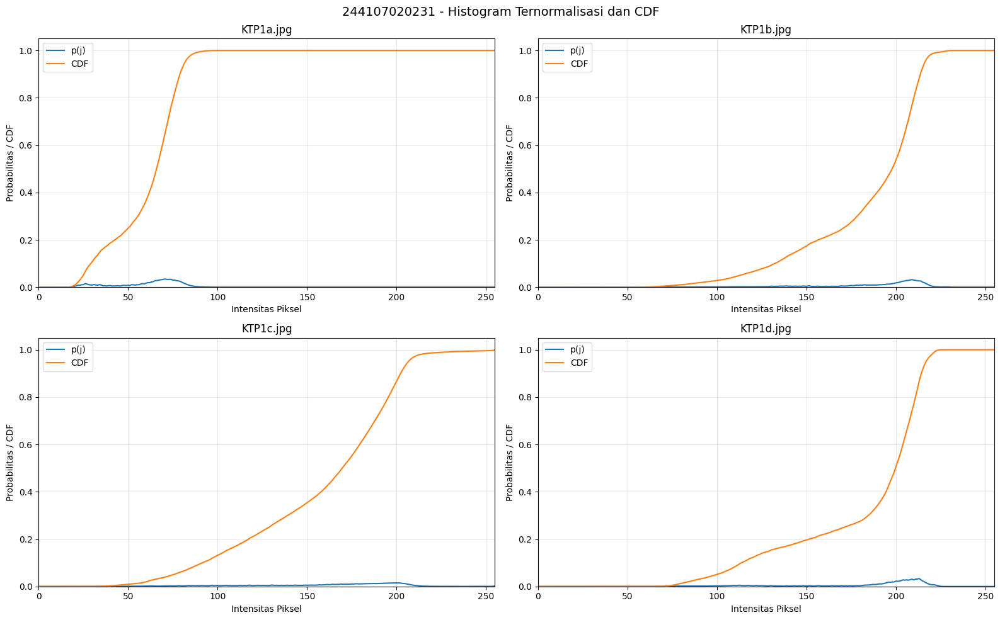

In [98]:
# ==========================================================
# E-1 NO.2
# HISTOGRAM TERNORMALISASI DAN CDF
# KTP1a.jpg - KTP1d.jpg
# ==========================================================

files = [
    'KTP1a.jpg',
    'KTP1b.jpg',
    'KTP1c.jpg',
    'KTP1d.jpg'
]

fig, axs = plt.subplots(2, 2, figsize=(16, 10))

for ax, file in zip(axs.ravel(), files):

    # Membaca citra
    img = cv.imread(BASE + '/' + file)

    # Mengubah BGR menjadi grayscale
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Histogram
    hist, bins = np.histogram(
        gray,
        bins=256,
        range=(0, 256)
    )

    # Histogram ternormalisasi p(j)
    p = hist / hist.sum()

    # CDF
    cdf = np.cumsum(p)

    # Histogram ternormalisasi
    ax.plot(
        range(256),
        p,
        label='p(j)'
    )

    # Kurva CDF
    ax.plot(
        range(256),
        cdf,
        label='CDF'
    )

    ax.set_title(file)
    ax.set_xlabel('Intensitas Piksel')
    ax.set_ylabel('Probabilitas / CDF')
    ax.set_xlim(0, 255)
    ax.set_ylim(0, 1.05)
    ax.grid(alpha=0.3)
    ax.legend()

plt.suptitle(
    NIM + ' - Histogram Ternormalisasi dan CDF',
    fontsize=14
)

plt.tight_layout()
plt.show()

In [99]:
# ==========================================================
# MENENTUKAN RATA-RATA INTENSITAS MASING-MASING CITRA
# ==========================================================

print('Rata-rata intensitas setiap citra:')
print('----------------------------------')

for file in files:

    img = cv.imread(BASE + '/' + file)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    mean_intensity = np.mean(gray)

    print(file, ':', round(mean_intensity, 2))

Rata-rata intensitas setiap citra:
----------------------------------
KTP1a.jpg : 60.9
KTP1b.jpg : 184.85
KTP1c.jpg : 158.38
KTP1d.jpg : 183.73


KTP1a merupakan citra paling gelap dengan rata-rata intensitas 60,90. Karena sebagian besar pikselnya memiliki intensitas rendah, CDF-nya naik lebih cepat di bagian kiri. Sedangkan KTP1b merupakan citra paling terang dengan rata-rata intensitas 184,85. Distribusi pikselnya lebih banyak berada pada intensitas tinggi, sehingga CDF-nya baru naik secara signifikan di bagian kanan. Perbedaan ini menunjukkan pengaruh kondisi pencahayaan saat proses akuisisi citra. KTP1a yang memiliki rata-rata intensitas rendah menunjukkan bahwa pencahayaan pada saat pengambilan citra relatif lebih rendah, sehingga sebagian besar piksel berada pada intensitas rendah. Sementara itu, KTP1b memiliki rata-rata intensitas paling tinggi yang menunjukkan bahwa pencahayaan pada saat akuisisi relatif lebih tinggi, sehingga distribusi piksel bergeser ke intensitas yang lebih tinggi.

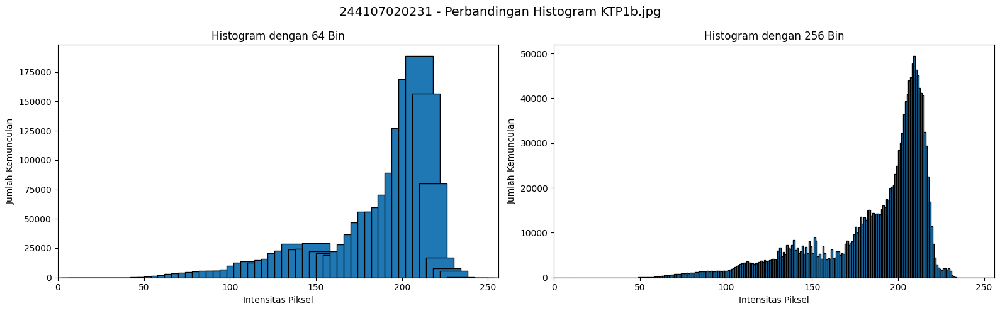

In [100]:
# ==========================================================
# E-1 NO.3
# PERBANDINGAN HISTOGRAM KTP1b.jpg
# PARAM['bins'] vs 256 BIN
# ==========================================================

# Membaca citra KTP1b
img = cv.imread(BASE + '/KTP1b.jpg')

# Mengubah citra menjadi grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Histogram dengan jumlah bin sesuai PARAM
hist_param, edges_param = np.histogram(
    gray,
    bins=PARAM['bins'],
    range=(0, 256)
)

# Histogram dengan 256 bin
hist_256, edges_256 = np.histogram(
    gray,
    bins=256,
    range=(0, 256)
)

# Posisi tengah setiap bin
centers_param = (edges_param[:-1] + edges_param[1:]) / 2
centers_256 = (edges_256[:-1] + edges_256[1:]) / 2


# ==========================================================
# MENAMPILKAN KEDUA HISTOGRAM BERDAMPINGAN
# ==========================================================

fig, axs = plt.subplots(1, 2, figsize=(16, 5))

fig.suptitle(
    NIM + ' - Perbandingan Histogram KTP1b.jpg',
    fontsize=14
)

# Histogram PARAM['bins']
axs[0].bar(
    centers_param,
    hist_param,
    width=16,
    edgecolor='black'
)

axs[0].set_title(
    'Histogram dengan ' + str(PARAM['bins']) + ' Bin'
)

axs[0].set_xlabel('Intensitas Piksel')
axs[0].set_ylabel('Jumlah Kemunculan')
axs[0].set_xlim(0, 256)


# Histogram 256 bin
axs[1].bar(
    centers_256,
    hist_256,
    width=1,
    edgecolor='black'
)

axs[1].set_title('Histogram dengan 256 Bin')
axs[1].set_xlabel('Intensitas Piksel')
axs[1].set_ylabel('Jumlah Kemunculan')
axs[1].set_xlim(0, 256)

plt.tight_layout()
plt.show()

Pada histogram 256 bin, setiap tingkat intensitas dari 0 sampai 255 dapat diamati secara lebih rinci. Sementara itu, pada histogram 64 bin, beberapa tingkat intensitas yang berdekatan digabungkan ke dalam satu bin. Karena 256 tingkat intensitas dibagi menjadi 64 bin, setiap bin secara umum mewakili 4 tingkat intensitas.

Pengurangan jumlah bin menyebabkan detail distribusi intensitas hilang. Perbedaan jumlah piksel pada intensitas yang berdekatan tidak dapat diamati secara terpisah karena telah digabungkan dalam bin yang sama. Hal ini membuat histogram 64 bin terlihat lebih sederhana dan kasar dibandingkan histogram 256 bin. Meskipun demikian, pola umum distribusi intensitas dan tingkat kecerahan citra masih dapat diamati.

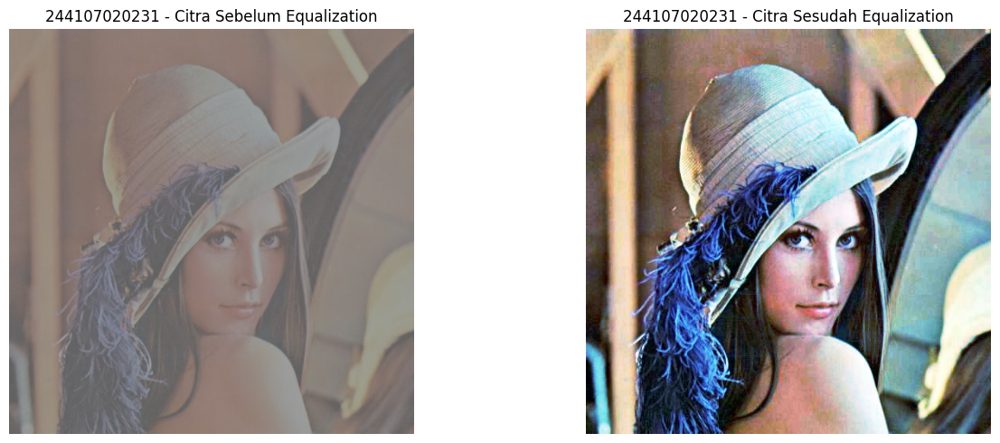

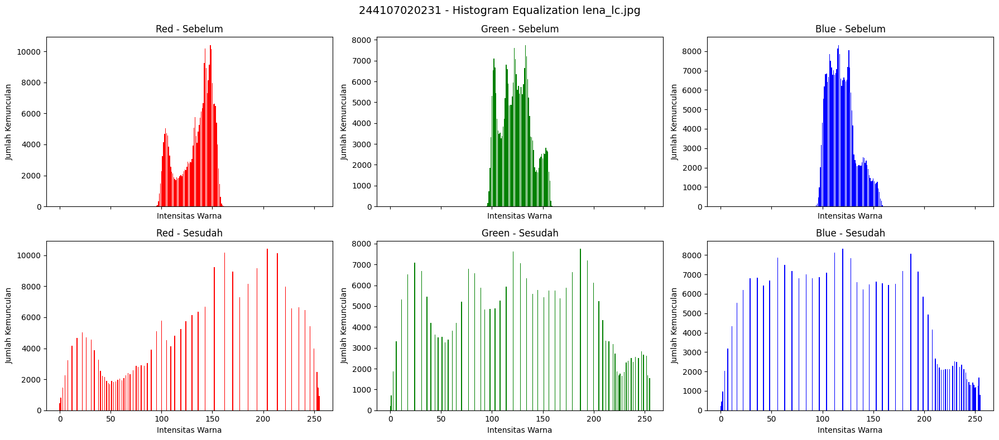

In [101]:
# ==========================================================
# E-2 NO.1
# HISTOGRAM EQUALIZATION MANUAL
# TAHAP 1 - lena_lc.jpg
# ==========================================================

# Membaca citra contoh
image = cv.imread(CONTOH + '/lena_lc.jpg')

# Memisahkan channel BGR
b, g, r = cv.split(image)


# ==========================================================
# FUNGSI HISTOGRAM EQUALIZATION MANUAL
# ==========================================================

def histogram_equalization_manual(channel):

    # 1. Menghitung histogram
    hist = histogram_manual(channel)

    # 2. Menghitung frekuensi kumulatif
    cdf = np.cumsum(hist)

    # 3. Normalisasi dengan jumlah seluruh pixel
    cdf_normalized = cdf / channel.size

    # 4. Implementasi rumus K
    L = 256

    K = np.round(
        cdf_normalized * (L - 1)
    ).astype(np.uint8)

    # 5. Transformasi pixel menggunakan nilai K
    result = K[channel]

    return result, hist, K


# ==========================================================
# PROSES HISTOGRAM EQUALIZATION
# ==========================================================

b_eq, hist_b, K_b = histogram_equalization_manual(b)
g_eq, hist_g, K_g = histogram_equalization_manual(g)
r_eq, hist_r, K_r = histogram_equalization_manual(r)


# Menggabungkan kembali channel
image_eq = cv.merge([b_eq, g_eq, r_eq])


# ==========================================================
# HISTOGRAM HASIL EQUALIZATION
# ==========================================================

hist_b_eq = histogram_manual(b_eq)
hist_g_eq = histogram_manual(g_eq)
hist_r_eq = histogram_manual(r_eq)


# ==========================================================
# MENAMPILKAN CITRA SEBELUM DAN SESUDAH
# ==========================================================

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Citra Sebelum Equalization')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(image_eq, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Citra Sesudah Equalization')
plt.axis('off')

plt.tight_layout()
plt.show()


# ==========================================================
# MENAMPILKAN HISTOGRAM SEBELUM DAN SESUDAH
# ==========================================================

names = np.arange(256)

fig, axs = plt.subplots(
    2, 3,
    figsize=(18, 8),
    sharex=True
)

fig.suptitle(
    NIM + ' - Histogram Equalization lena_lc.jpg',
    fontsize=14
)

# Sebelum
axs[0, 0].bar(names, hist_r, color='red')
axs[0, 0].set_title('Red - Sebelum')

axs[0, 1].bar(names, hist_g, color='green')
axs[0, 1].set_title('Green - Sebelum')

axs[0, 2].bar(names, hist_b, color='blue')
axs[0, 2].set_title('Blue - Sebelum')

# Sesudah
axs[1, 0].bar(names, hist_r_eq, color='red')
axs[1, 0].set_title('Red - Sesudah')

axs[1, 1].bar(names, hist_g_eq, color='green')
axs[1, 1].set_title('Green - Sesudah')

axs[1, 2].bar(names, hist_b_eq, color='blue')
axs[1, 2].set_title('Blue - Sesudah')

for ax in axs.flat:
    ax.set_xlabel('Intensitas Warna')
    ax.set_ylabel('Jumlah Kemunculan')

plt.tight_layout()
plt.show()

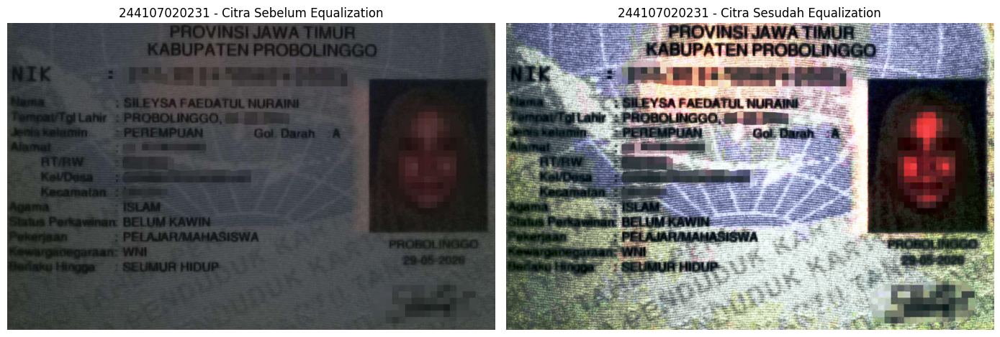

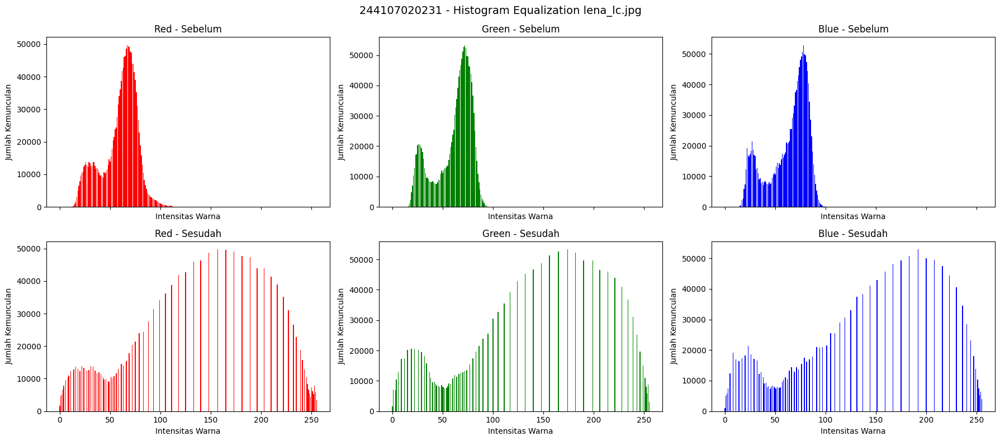

In [102]:
# ==========================================================
# E-2 NO.1
# HISTOGRAM EQUALIZATION MANUAL
# TAHAP 1 - lena_lc.jpg
# ==========================================================

# Membaca citra contoh
image = cv.imread(BASE + '/KTP1a.jpg')

# Memisahkan channel BGR
b, g, r = cv.split(image)


# ==========================================================
# FUNGSI HISTOGRAM EQUALIZATION MANUAL
# ==========================================================

def histogram_equalization_manual(channel):

    # 1. Menghitung histogram
    hist = histogram_manual(channel)

    # 2. Menghitung frekuensi kumulatif
    cdf = np.cumsum(hist)

    # 3. Normalisasi dengan jumlah seluruh pixel
    cdf_normalized = cdf / channel.size

    # 4. Implementasi rumus K
    L = 256

    K = np.round(
        cdf_normalized * (L - 1)
    ).astype(np.uint8)

    # 5. Transformasi pixel menggunakan nilai K
    result = K[channel]

    return result, hist, K


# ==========================================================
# PROSES HISTOGRAM EQUALIZATION
# ==========================================================

b_eq, hist_b, K_b = histogram_equalization_manual(b)
g_eq, hist_g, K_g = histogram_equalization_manual(g)
r_eq, hist_r, K_r = histogram_equalization_manual(r)


# Menggabungkan kembali channel
image_eq = cv.merge([b_eq, g_eq, r_eq])


# ==========================================================
# HISTOGRAM HASIL EQUALIZATION
# ==========================================================

hist_b_eq = histogram_manual(b_eq)
hist_g_eq = histogram_manual(g_eq)
hist_r_eq = histogram_manual(r_eq)


# ==========================================================
# MENAMPILKAN CITRA SEBELUM DAN SESUDAH
# ==========================================================

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Citra Sebelum Equalization')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(image_eq, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Citra Sesudah Equalization')
plt.axis('off')

plt.tight_layout()
plt.show()


# ==========================================================
# MENAMPILKAN HISTOGRAM SEBELUM DAN SESUDAH
# ==========================================================

names = np.arange(256)

fig, axs = plt.subplots(
    2, 3,
    figsize=(18, 8),
    sharex=True
)

fig.suptitle(
    NIM + ' - Histogram Equalization lena_lc.jpg',
    fontsize=14
)

# Sebelum
axs[0, 0].bar(names, hist_r, color='red')
axs[0, 0].set_title('Red - Sebelum')

axs[0, 1].bar(names, hist_g, color='green')
axs[0, 1].set_title('Green - Sebelum')

axs[0, 2].bar(names, hist_b, color='blue')
axs[0, 2].set_title('Blue - Sebelum')

# Sesudah
axs[1, 0].bar(names, hist_r_eq, color='red')
axs[1, 0].set_title('Red - Sesudah')

axs[1, 1].bar(names, hist_g_eq, color='green')
axs[1, 1].set_title('Green - Sesudah')

axs[1, 2].bar(names, hist_b_eq, color='blue')
axs[1, 2].set_title('Blue - Sesudah')

for ax in axs.flat:
    ax.set_xlabel('Intensitas Warna')
    ax.set_ylabel('Jumlah Kemunculan')

plt.tight_layout()
plt.show()

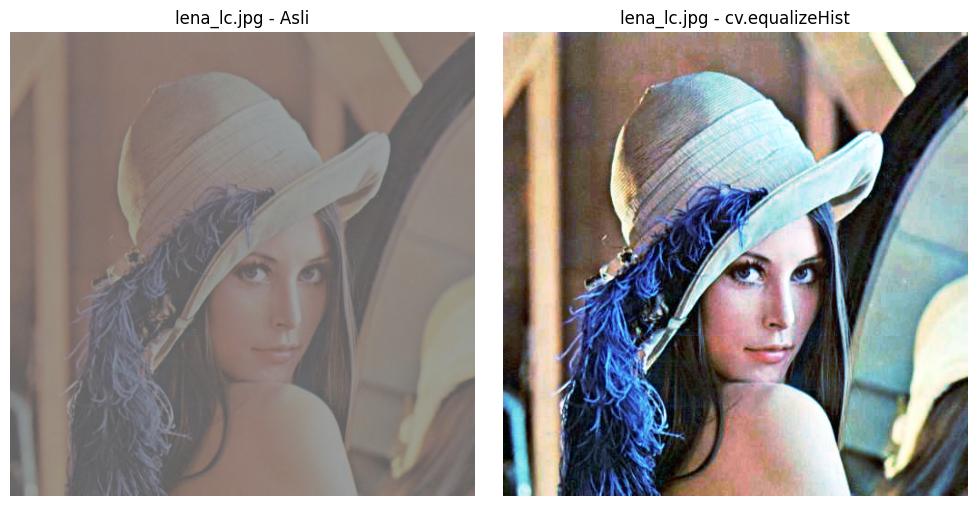

In [103]:
# ==========================================================
# E-2 NO.2
# CV2 equalizeHist - lena_lc.jpg
# ==========================================================

image = cv.imread(CONTOH + '/lena_lc.jpg')

# Memisahkan channel BGR
b, g, r = cv.split(image)

# Equalization menggunakan OpenCV
b_equalized = cv.equalizeHist(b)
g_equalized = cv.equalizeHist(g)
r_equalized = cv.equalizeHist(r)

# Menggabungkan kembali channel
image_equalized_cv = cv.merge([
    b_equalized,
    g_equalized,
    r_equalized
])

# Menampilkan hasil
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title('lena_lc.jpg - Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(image_equalized_cv, cv.COLOR_BGR2RGB))
plt.title('lena_lc.jpg - cv.equalizeHist')
plt.axis('off')

plt.tight_layout()
plt.show()

In [104]:
# ==========================================================
# PERBANDINGAN MANUAL vs cv.equalizeHist
# lena_lc.jpg
# ==========================================================

# Manual
b_manual, _, _ = histogram_equalization_manual(b)
g_manual, _, _ = histogram_equalization_manual(g)
r_manual, _, _ = histogram_equalization_manual(r)

image_equalized_manual = cv.merge([
    b_manual,
    g_manual,
    r_manual
])

# Selisih maksimum
selisih_lena = np.max(
    np.abs(
        image_equalized_manual.astype(np.int16) -
        image_equalized_cv.astype(np.int16)
    )
)

print('=== PERBANDINGAN LENA_LC.JPG ===')
print('Selisih maksimum Manual vs OpenCV :', selisih_lena)

=== PERBANDINGAN LENA_LC.JPG ===
Selisih maksimum Manual vs OpenCV : 0


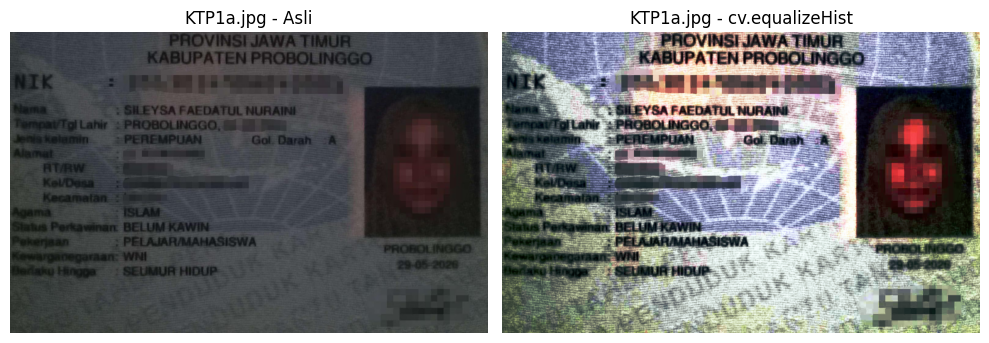

In [105]:
# ==========================================================
# KTP1a.jpg
# ==========================================================

image = cv.imread(BASE + '/KTP1a.jpg')

# Memisahkan channel BGR
b, g, r = cv.split(image)

# Equalization menggunakan OpenCV
b_equalized = cv.equalizeHist(b)
g_equalized = cv.equalizeHist(g)
r_equalized = cv.equalizeHist(r)

# Menggabungkan kembali channel
image_equalized_cv = cv.merge([
    b_equalized,
    g_equalized,
    r_equalized
])

# Menampilkan hasil
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title('KTP1a.jpg - Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(image_equalized_cv, cv.COLOR_BGR2RGB))
plt.title('KTP1a.jpg - cv.equalizeHist')
plt.axis('off')

plt.tight_layout()
plt.show()

In [106]:
# ==========================================================
# PERBANDINGAN MANUAL VS OPENCV
# ==========================================================

# Manual
b_manual, _, _ = histogram_equalization_manual(b)
g_manual, _, _ = histogram_equalization_manual(g)
r_manual, _, _ = histogram_equalization_manual(r)

image_equalized_manual = cv.merge([
    b_manual,
    g_manual,
    r_manual
])

# Selisih maksimum
selisih_KTP1a = np.max(
    np.abs(
        image_equalized_manual.astype(np.int16) -
        image_equalized_cv.astype(np.int16)
    )
)

print('=== PERBANDINGAN KTP1a.JPG ===')
print('Selisih maksimum Manual vs OpenCV :', selisih_KTP1a)

=== PERBANDINGAN KTP1a.JPG ===
Selisih maksimum Manual vs OpenCV : 0


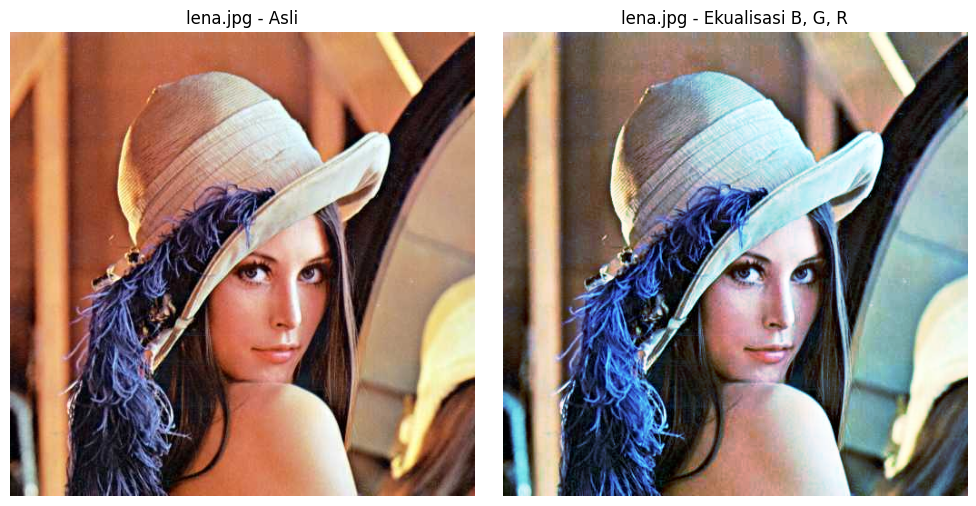

In [107]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

berkas = CONTOH + '/lena.jpg'
bgr = cv.imread(berkas)

# cara 1: tiap kanal diekualisasi sendiri-sendiri
kanal = list(cv.split(bgr))

for i in range(3):
    kanal[i] = cv.equalizeHist(kanal[i])

he_rgb = cv.merge(kanal)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(bgr, cv.COLOR_BGR2RGB))
plt.title('lena.jpg - Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(he_rgb, cv.COLOR_BGR2RGB))
plt.title('lena.jpg - Ekualisasi B, G, R')
plt.axis('off')

plt.tight_layout()
plt.show()

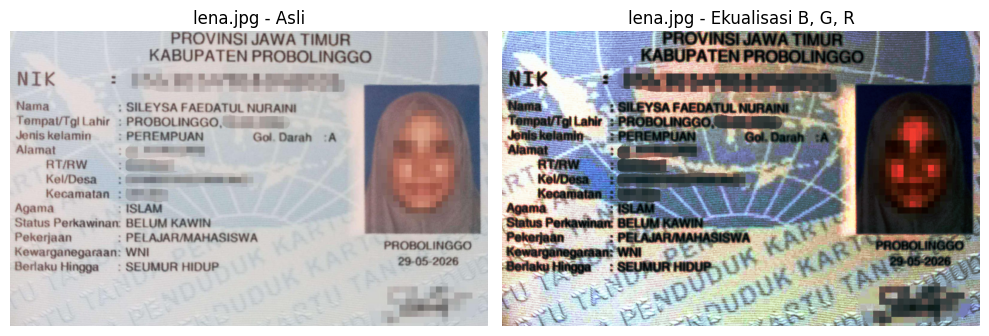

In [108]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

berkas = BASE + '/KTP1d.jpg'
bgr = cv.imread(berkas)

# cara 1: tiap kanal diekualisasi sendiri-sendiri
kanal = list(cv.split(bgr))

for i in range(3):
    kanal[i] = cv.equalizeHist(kanal[i])

he_rgb = cv.merge(kanal)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(bgr, cv.COLOR_BGR2RGB))
plt.title('lena.jpg - Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(he_rgb, cv.COLOR_BGR2RGB))
plt.title('lena.jpg - Ekualisasi B, G, R')
plt.axis('off')

plt.tight_layout()
plt.show()

In [109]:
# ==========================================================
# E-2 NO.4
# KTP1d.jpg
# ==========================================================

berkas = BASE + '/KTP1d.jpg'
bgr = cv.imread(berkas)

In [110]:
# cara 2: hanya kanal terang yang diekualisasi

ycrcb = cv.cvtColor(bgr, cv.COLOR_BGR2YCrCb)

y, cr, cb = cv.split(ycrcb)

he_y = cv.cvtColor(
    cv.merge([
        cv.equalizeHist(y),
        cr,
        cb
    ]),
    cv.COLOR_YCrCb2BGR
)


# varian setara pada ruang warna lain

hsv = cv.cvtColor(bgr, cv.COLOR_BGR2HSV)

h, sat, v = cv.split(hsv)

he_v = cv.cvtColor(
    cv.merge([
        h,
        sat,
        cv.equalizeHist(v)
    ]),
    cv.COLOR_HSV2BGR
)


lab = cv.cvtColor(bgr, cv.COLOR_BGR2LAB)

l, a, b = cv.split(lab)

he_l = cv.cvtColor(
    cv.merge([
        cv.equalizeHist(l),
        a,
        b
    ]),
    cv.COLOR_LAB2BGR
)

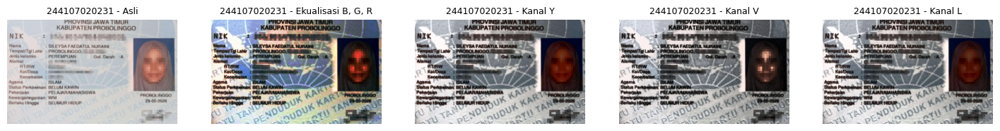

In [111]:
judul = [
    'Asli',
    'Ekualisasi B, G, R',
    'Kanal Y',
    'Kanal V',
    'Kanal L'
]

citra = [
    bgr,
    he_rgb,
    he_y,
    he_v,
    he_l
]

plt.figure(figsize=(18, 4))

for i, (c, t) in enumerate(zip(citra, judul), 1):
    plt.subplot(1, 5, i)

    plt.imshow(cv.cvtColor(c, cv.COLOR_BGR2RGB))

    plt.title(
        NIM + ' - ' + t,
        fontsize=9
    )

    plt.axis('off')

plt.show()

In [112]:
def geser_hue(asli, hasil):
    h1 = cv.cvtColor(
        asli,
        cv.COLOR_BGR2HSV
    )[:, :, 0].astype(np.int16)

    h2 = cv.cvtColor(
        hasil,
        cv.COLOR_BGR2HSV
    )[:, :, 0].astype(np.int16)

    d = np.abs(h1 - h2)

    d = np.minimum(
        d,
        180 - d
    )  # Hue melingkar 0-179

    return d.mean()

In [113]:
print(
    '%-22s %16s %16s'
    % (
        'Cara',
        'geser Hue (der)',
        'rerata terang'
    )
)

for t, c in zip(judul, citra):
    print(
        '%-22s %16.2f %16.1f'
        % (
            t,
            geser_hue(bgr, c) * 2,
            cv.cvtColor(
                c,
                cv.COLOR_BGR2GRAY
            ).mean()
        )
    )

Cara                    geser Hue (der)    rerata terang
Asli                               0.00            183.7
Ekualisasi B, G, R                36.51            129.6
Kanal Y                            0.57            129.6
Kanal V                            3.87            125.4
Kanal L                            5.50            125.1


**Tabel** (isi angka dari keluaran kode di atas):

| Cara ekualisasi | Rata-rata pergeseran Hue (derajat) | Rerata kecerahan sesudah | Catatan pengamatan visual |
|---|---|---|---|
| Citra asli | 0.00 | 183.7 | Citra asli digunakan sebagai pembanding |
| Ekualisasi kanal B, G, R | 36.51 | 129.6 | Warna berubah cukup jelas dan muncul pergeseran warna yang kuat |
| Kanal Y (YCrCb) | 0.57 | 129.6 | Warna relatif tetap, tetapi kontras/kecerahan citra berubah |
| Kanal V (HSV) | 3.87 | 125.4 | Warna mengalami perubahan kecil dibanding citra asli |
| Kanal L (LAB) | 5.50 | 125.1 | Warna mengalami perubahan kecil dan kontras citra meningkat |

1. Ekualisasi kanal B, G, dan R menghasilkan pergeseran Hue paling besar, yaitu 36.51 derajat
2. Ketika nilai dikonversi kembali ke BGR, terjadi perhitungan ulang nilai kanal B, G, dan R. Nilai hasil konversi kemudian mengalami pembulatan/pemotongan ke rentang nilai piksel yang dapat direpresentasikan.Akibatnya, walaupun kanal warna seperti Cr-Cb, H-S, atau a-b tidak diekualisasi secara langsung, nilai BGR hasil rekonstruksi tidak selalu identik dengan nilai sebelum transformasi. Perubahan kecil tersebut kemudian dapat menyebabkan Hue berubah sedikit.
3. Berdasarkan hasil pengukuran, kanal Y pada ruang warna YCrCb merupakan metode yang paling sesuai untuk citra KTP1d karena menghasilkan rata-rata pergeseran Hue paling kecil, yaitu 0.57 derajat. Nilai tersebut lebih kecil dibandingkan kanal V sebesar 3.87 derajat dan kanal L sebesar 5.50 derajat. Hal ini menunjukkan bahwa warna citra lebih terjaga ketika ekualisasi dilakukan pada kanal Y. Bagian yang menjadi dasar penilaian adalah area foto wajah dan bagian berwarna pada kartu, yang secara visual tetap mempertahankan karakteristik warna dibandingkan hasil ekualisasi kanal B, G, dan R.

In [114]:
# ==========================================================
# E-2 NO.4
# CLAHE PADA KANAL Y
# ==========================================================

# Mengubah BGR ke YCrCb
ycrcb = cv.cvtColor(bgr, cv.COLOR_BGR2YCrCb)

# Memisahkan channel
y, cr, cb = cv.split(ycrcb)

# Membuat CLAHE sesuai PARAM
clahe = cv.createCLAHE(
    clipLimit=PARAM['clip'],
    tileGridSize=(PARAM['tile'], PARAM['tile'])
)

# CLAHE hanya pada kanal Y
y_clahe = clahe.apply(y)

# Menggabungkan kembali Y, Cr, Cb
he_y_clahe = cv.cvtColor(
    cv.merge([y_clahe, cr, cb]),
    cv.COLOR_YCrCb2BGR
)

In [115]:
# ==========================================================
# PERBANDINGAN Y BIASA vs CLAHE Y
# ==========================================================

hue_y_clahe = geser_hue(bgr, he_y_clahe) * 2

bright_y_clahe = cv.cvtColor(
    he_y_clahe,
    cv.COLOR_BGR2GRAY
).mean()

print('=== PERBANDINGAN KANAL Y ===')

print('Y - equalizeHist')
print('Pergeseran Hue : %.2f derajat' %
      (geser_hue(bgr, he_y) * 2))
print('Rerata terang  : %.1f' %
      cv.cvtColor(he_y, cv.COLOR_BGR2GRAY).mean())

print()

print('Y - CLAHE')
print('Pergeseran Hue : %.2f derajat' %
      hue_y_clahe)
print('Rerata terang  : %.1f' %
      bright_y_clahe)

=== PERBANDINGAN KANAL Y ===
Y - equalizeHist
Pergeseran Hue : 0.57 derajat
Rerata terang  : 129.6

Y - CLAHE
Pergeseran Hue : 0.00 derajat
Rerata terang  : 176.3


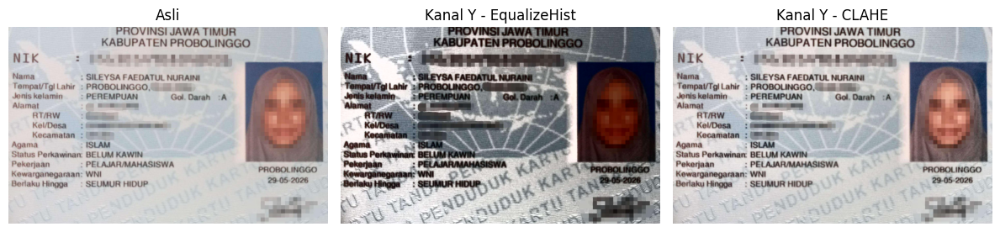

In [116]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(bgr, cv.COLOR_BGR2RGB))
plt.title('Asli')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(he_y, cv.COLOR_BGR2RGB))
plt.title('Kanal Y - EqualizeHist')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(he_y_clahe, cv.COLOR_BGR2RGB))
plt.title('Kanal Y - CLAHE')
plt.axis('off')

plt.tight_layout()
plt.show()

4. cv.equalizeHist pada kanal Y menghasilkan pergeseran Hue 0.57 derajat dan rerata kecerahan 129.6, sedangkan CLAHE menghasilkan pergeseran Hue 0.00 derajat dan rerata kecerahan 176.3. Pada citra ini, CLAHE lebih mempertahankan Hue dan menghasilkan kecerahan yang lebih mendekati citra asli (183.7).

In [117]:
# ==========================================================
# PERTANYAAN PRAKTIKUM E2 - NO. 1
# EKUALISASI GLOBAL KTP1a.jpg
# ==========================================================

# Membaca KTP1a dalam grayscale
gray = cv.imread(
    BASE + '/KTP1a.jpg',
    cv.IMREAD_GRAYSCALE
)

# ==========================================================
# 1. EKUALISASI MANUAL
# ==========================================================

gray_manual, hist_manual, cdf_manual = histogram_equalization_manual(gray)

# ==========================================================
# 2. EKUALISASI MENGGUNAKAN OPENCV
# ==========================================================

gray_cv = cv.equalizeHist(gray)

# ==========================================================
# 3. CEK SELISIH MANUAL DAN OPENCV
# ==========================================================

selisih = np.max(
    np.abs(
        gray_manual.astype(np.int16) -
        gray_cv.astype(np.int16)
    )
)

print('=== PERBANDINGAN EQUALIZATION ===')
print('Selisih maksimum Manual vs OpenCV :', selisih)

=== PERBANDINGAN EQUALIZATION ===
Selisih maksimum Manual vs OpenCV : 0


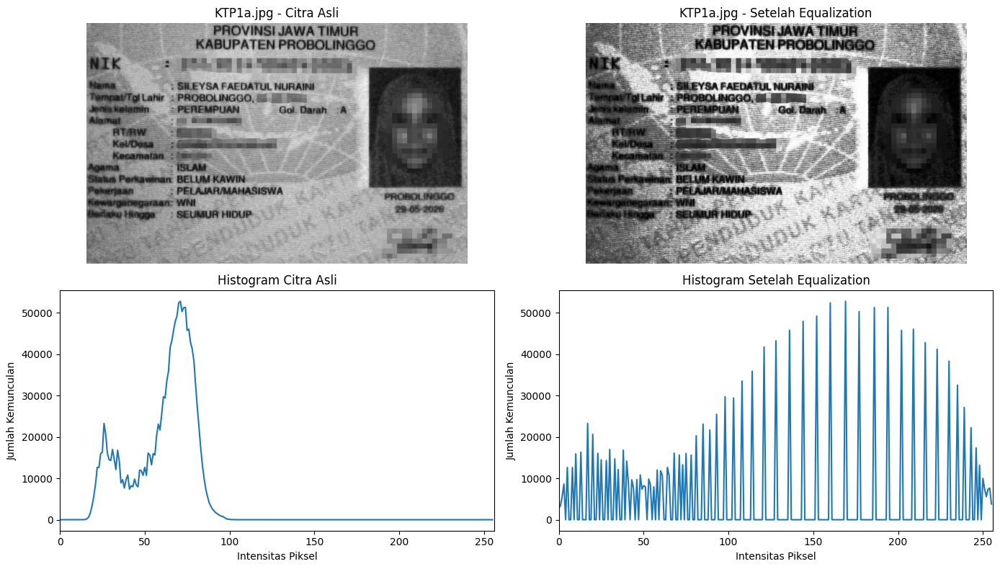

In [118]:
# ==========================================================
# MENAMPILKAN CITRA DAN HISTOGRAM
# ==========================================================

# Histogram citra asli
hist_asli = cv.calcHist(
    [gray],
    [0],
    None,
    [256],
    [0, 256]
).flatten()

# Histogram citra hasil equalization
hist_equalized = cv.calcHist(
    [gray_cv],
    [0],
    None,
    [256],
    [0, 256]
).flatten()

plt.figure(figsize=(14, 8))

# ----------------------------------------------------------
# Citra asli
# ----------------------------------------------------------

plt.subplot(2, 2, 1)
plt.imshow(gray, cmap='gray')
plt.title('KTP1a.jpg - Citra Asli')
plt.axis('off')

# ----------------------------------------------------------
# Citra hasil equalization
# ----------------------------------------------------------

plt.subplot(2, 2, 2)
plt.imshow(gray_cv, cmap='gray')
plt.title('KTP1a.jpg - Setelah Equalization')
plt.axis('off')

# ----------------------------------------------------------
# Histogram asli
# ----------------------------------------------------------

plt.subplot(2, 2, 3)
plt.plot(hist_asli)
plt.title('Histogram Citra Asli')
plt.xlabel('Intensitas Piksel')
plt.ylabel('Jumlah Kemunculan')
plt.xlim([0, 256])

# ----------------------------------------------------------
# Histogram hasil equalization
# ----------------------------------------------------------

plt.subplot(2, 2, 4)
plt.plot(hist_equalized)
plt.title('Histogram Setelah Equalization')
plt.xlabel('Intensitas Piksel')
plt.ylabel('Jumlah Kemunculan')
plt.xlim([0, 256])

plt.tight_layout()
plt.show()

In [119]:
# ==========================================================
# PSNR
# ==========================================================

psnr = cv.PSNR(gray, gray_cv)

print('PSNR citra asli vs hasil equalization :',
      psnr, 'dB')

PSNR citra asli vs hasil equalization : 9.056610681263564 dB


c. Nilai PSNR antara citra asli dan citra hasil histogram equalization adalah 9.056611 dB. Nilai PSNR menjadi rendah karena histogram equalization mengubah nilai intensitas piksel untuk meningkatkan distribusi kontras citra. Akibat perubahan tersebut, nilai piksel citra hasil menjadi semakin berbeda dari citra asli sehingga nilai PSNR menurun. Namun, penurunan PSNR tidak berarti citra hasil menjadi lebih buruk secara visual karena histogram equalization bertujuan meningkatkan kontras dan membuat detail yang sebelumnya kurang terlihat menjadi lebih jelas. Oleh karena itu, PSNR tidak cukup digunakan sebagai satu-satunya ukuran untuk menilai keterbacaan citra, karena PSNR mengukur kemiripan nilai piksel terhadap citra asli, bukan tingkat keterbacaan atau kejelasan informasi pada citra.

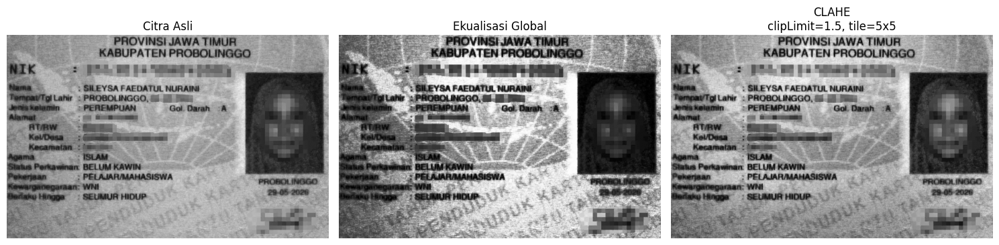

In [120]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Baca citra grayscale
gray = cv.imread(BASE + '/KTP1a.jpg', cv.IMREAD_GRAYSCALE)

# ==============================
# EKUALISASI GLOBAL
# ==============================
global_eq = cv.equalizeHist(gray)

# ==============================
# CLAHE
# ==============================
clahe = cv.createCLAHE(
    clipLimit=PARAM['clip'],
    tileGridSize=(PARAM['tile'], PARAM['tile'])
)

clahe_result = clahe.apply(gray)

# ==============================
# TAMPILKAN HASIL
# ==============================
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(gray, cmap='gray')
plt.title('Citra Asli')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(global_eq, cmap='gray')
plt.title('Ekualisasi Global')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(clahe_result, cmap='gray')
plt.title(
    f'CLAHE\nclipLimit={PARAM["clip"]}, tile={PARAM["tile"]}x{PARAM["tile"]}'
)
plt.axis('off')

plt.tight_layout()
plt.show()

2. a. Berdasarkan hasil perbandingan, citra dengan metode CLAHE membuat bagian nama pada kartu terlihat lebih terbaca dibandingkan ekualisasi global. CLAHE melakukan peningkatan kontras secara lokal sehingga detail pada area tertentu dapat dipertahankan dengan lebih baik. Sementara itu, ekualisasi global menggunakan satu distribusi histogram untuk seluruh citra sehingga pada beberapa bagian peningkatan kontras dapat menjadi kurang merata.

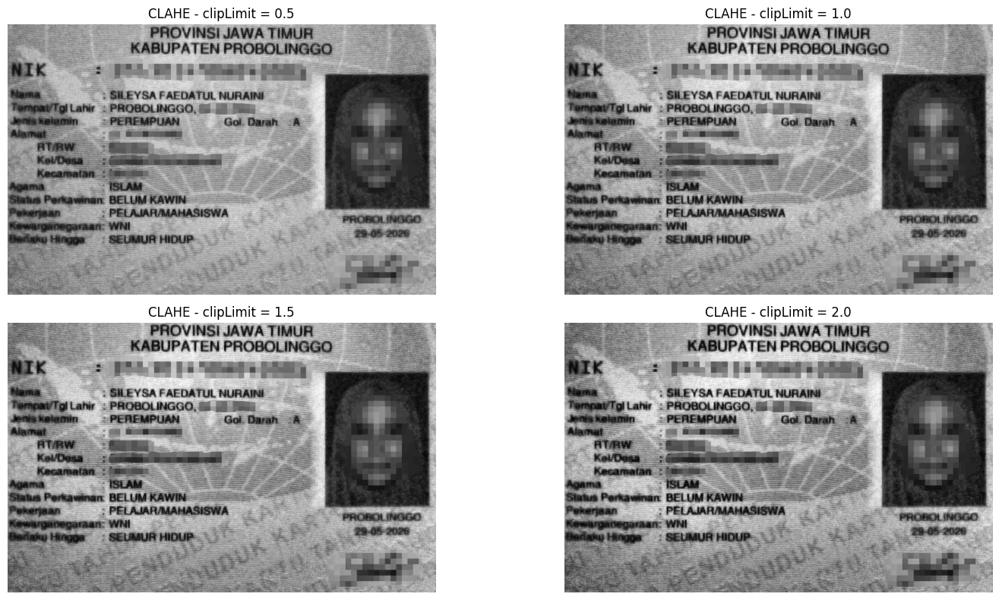

In [121]:
# Nilai clipLimit yang akan dibandingkan
clip_values = [0.5, 1.0, 1.5, 2.0]

plt.figure(figsize=(16, 8))

for i, clip in enumerate(clip_values):

    clahe = cv.createCLAHE(
        clipLimit=clip,
        tileGridSize=(PARAM['tile'], PARAM['tile'])
    )

    hasil = clahe.apply(gray)

    plt.subplot(2, 2, i + 1)
    plt.imshow(hasil, cmap='gray')
    plt.title(f'CLAHE - clipLimit = {clip}')
    plt.axis('off')

plt.tight_layout()
plt.show()

2. b. Dari hasil pengamatan, nilai 1.5 dipilih sebagai nilai terbaik karena memberikan keseimbangan antara keterbacaan tulisan, peningkatan kontras, dan tingkat noise. Pada clipLimit = 0.5, kontras masih relatif rendah. Pada 1.0, tulisan mulai terlihat lebih jelas. Pada 1.5, NIM dan nama terlihat lebih tegas tanpa peningkatan noise yang terlalu berlebihan. Sedangkan pada 2.0, kontras semakin kuat tetapi tekstur dan noise pada background kartu, terutama area berpola di bagian tengah dan bawah, mulai lebih menonjol.

In [122]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt


def floyd_steinberg_dithering(image, levels=2):
    """
    Floyd-Steinberg dithering untuk citra berwarna.
    Setiap channel RGB diproses secara terpisah.

    levels:
        2 = dua level
        4 = empat level
        dst.
    """

    img = image.astype(np.float32).copy()

    # Jarak antar level
    step = 255.0 / (levels - 1)

    height, width, channels = img.shape

    for c in range(channels):

        for y in range(height):
            for x in range(width):

                old_pixel = img[y, x, c]

                # Kuantisasi ke level terdekat
                new_pixel = np.round(old_pixel / step) * step
                new_pixel = np.clip(new_pixel, 0, 255)

                # Hitung error
                error = old_pixel - new_pixel

                # Simpan nilai baru
                img[y, x, c] = new_pixel

                # Distribusi error Floyd-Steinberg
                if x + 1 < width:
                    img[y, x + 1, c] += error * 7 / 16

                if y + 1 < height and x - 1 >= 0:
                    img[y + 1, x - 1, c] += error * 3 / 16

                if y + 1 < height:
                    img[y + 1, x, c] += error * 5 / 16

                if y + 1 < height and x + 1 < width:
                    img[y + 1, x + 1, c] += error * 1 / 16

    return np.clip(img, 0, 255).astype(np.uint8)

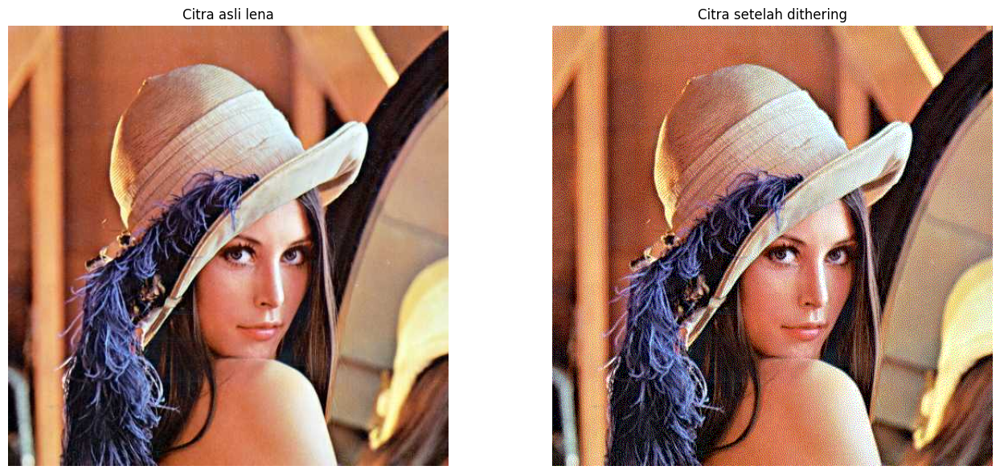

In [123]:
lena_bgr = cv.imread(CONTOH + '/lena.jpg')

# Ubah BGR -> RGB
lena_rgb = cv.cvtColor(lena_bgr, cv.COLOR_BGR2RGB)

# Floyd-Steinberg dengan 2 level
lena_dither = floyd_steinberg_dithering(
    lena_rgb,
    levels=4
)

# Tampilkan
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(lena_rgb)
plt.title('Citra asli lena')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(lena_dither)
plt.title('Citra setelah dithering')
plt.axis('off')

plt.tight_layout()
plt.show()

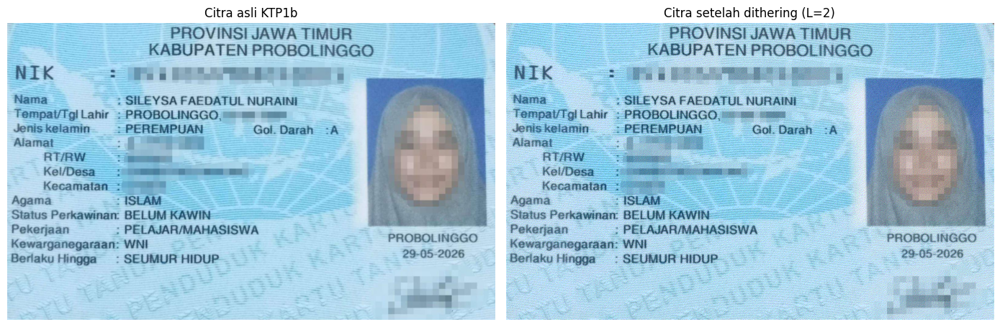

In [124]:
# ============================================
# E-3 Tahap 2 - Dithering KTP1b
# ============================================

# Baca KTP1b
ktp_bgr = cv.imread(BASE + '/KTP1b.jpg')

# BGR -> RGB agar tampilannya benar
ktp_rgb = cv.cvtColor(ktp_bgr, cv.COLOR_BGR2RGB)

# Gunakan jumlah level dari parameter NIM
ktp_dither = floyd_steinberg_dithering(
    ktp_rgb,
    levels=PARAM['L']
)

# Tampilkan hasil
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(ktp_rgb)
plt.title('Citra asli KTP1b')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(ktp_dither)
plt.title(f'Citra setelah dithering (L={PARAM["L"]})')
plt.axis('off')

plt.tight_layout()
plt.show()

In [125]:
def floyd_steinberg_gray(image, levels=2):
    img = image.astype(np.float32).copy()

    step = 255.0 / (levels - 1)

    H, W = img.shape

    for y in range(H):
        for x in range(W):

            # Nilai piksel sebelum dithering
            lama = img[y, x]

            # Cari level terdekat
            baru = np.round(lama / step) * step
            baru = np.clip(baru, 0, 255)

            # Simpan nilai baru
            img[y, x] = baru

            # Hitung error
            error = lama - baru

            # 7/16 -> kanan
            if x + 1 < W:
                img[y, x + 1] = np.clip(
                    img[y, x + 1] + error * 7 / 16,
                    0, 255
                )

            # 3/16 -> kiri bawah
            if x > 0 and y + 1 < H:
                img[y + 1, x - 1] = np.clip(
                    img[y + 1, x - 1] + error * 3 / 16,
                    0, 255
                )

            # 5/16 -> bawah
            if y + 1 < H:
                img[y + 1, x] = np.clip(
                    img[y + 1, x] + error * 5 / 16,
                    0, 255
                )

            # 1/16 -> kanan bawah
            if x + 1 < W and y + 1 < H:
                img[y + 1, x + 1] = np.clip(
                    img[y + 1, x + 1] + error * 1 / 16,
                    0, 255
                )

    return np.clip(img, 0, 255).astype(np.uint8)

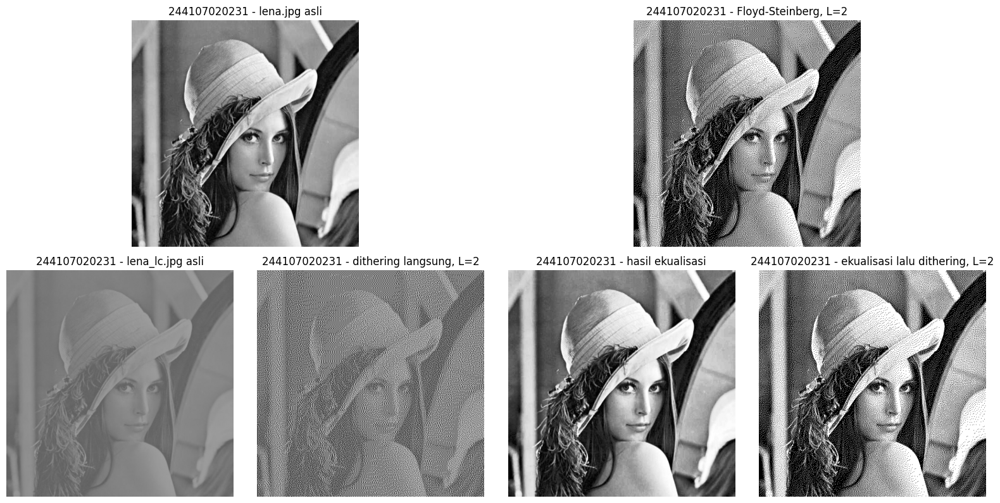

In [126]:
# ============================================
# E-3 NOMOR 1 DAN NOMOR 2
# ============================================

# --------------------------------------------
# 1. LENA.JPG
# --------------------------------------------

lena = cv.imread(
    CONTOH + '/lena.jpg',
    cv.IMREAD_GRAYSCALE
)

lena_dither = floyd_steinberg_gray(
    lena,
    levels=PARAM['L']
)


# --------------------------------------------
# 2. LENA_LC.JPG
# --------------------------------------------

lena_lc = cv.imread(
    CONTOH + '/lena_lc.jpg',
    cv.IMREAD_GRAYSCALE
)

if lena_lc is None:
    raise FileNotFoundError(
        'File lena_lc.jpg tidak ditemukan'
    )


# Dithering langsung
lena_lc_dither = floyd_steinberg_gray(
    lena_lc,
    levels=PARAM['L']
)

# Histogram Equalization
lena_lc_eq = cv.equalizeHist(lena_lc)

# Equalization lalu dithering
lena_lc_eq_dither = floyd_steinberg_gray(
    lena_lc_eq,
    levels=PARAM['L']
)


# ============================================
# TAMPILKAN SESUAI GAMBAR CONTOH MODUL
# ============================================

fig = plt.figure(figsize=(16, 12))

# ============================================
# BARIS ATAS
# 2 gambar lena.jpg
# ============================================

ax1 = plt.subplot2grid((3, 4), (0, 0), colspan=2)

ax1.imshow(
    lena,
    cmap='gray',
    vmin=0,
    vmax=255
)

ax1.set_title(NIM + ' - ' + 'lena.jpg asli')
ax1.axis('off')


ax2 = plt.subplot2grid((3, 4), (0, 2), colspan=2)

ax2.imshow(
    lena_dither,
    cmap='gray',
    vmin=0,
    vmax=255
)

ax2.set_title(
    NIM + ' - ' + f'Floyd-Steinberg, L={PARAM["L"]}'
)

ax2.axis('off')


# ============================================
# BARIS BAWAH
# 4 gambar lena_lc.jpg
# ============================================

ax3 = plt.subplot2grid((3, 4), (1, 0))

ax3.imshow(
    lena_lc,
    cmap='gray',
    vmin=0,
    vmax=255
)

ax3.set_title(NIM + ' - ' + 'lena_lc.jpg asli')
ax3.axis('off')


ax4 = plt.subplot2grid((3, 4), (1, 1))

ax4.imshow(
    lena_lc_dither,
    cmap='gray',
    vmin=0,
    vmax=255
)

ax4.set_title(
    NIM + ' - ' + f'dithering langsung, L={PARAM["L"]}'
)

ax4.axis('off')


ax5 = plt.subplot2grid((3, 4), (1, 2))

ax5.imshow(
    lena_lc_eq,
    cmap='gray',
    vmin=0,
    vmax=255
)

ax5.set_title(NIM + ' - ' + 'hasil ekualisasi')
ax5.axis('off')


ax6 = plt.subplot2grid((3, 4), (1, 3))

ax6.imshow(
    lena_lc_eq_dither,
    cmap='gray',
    vmin=0,
    vmax=255
)

ax6.set_title(
    NIM + ' - ' + f'ekualisasi lalu dithering, L={PARAM["L"]}'
)

ax6.axis('off')


plt.tight_layout()
plt.show()

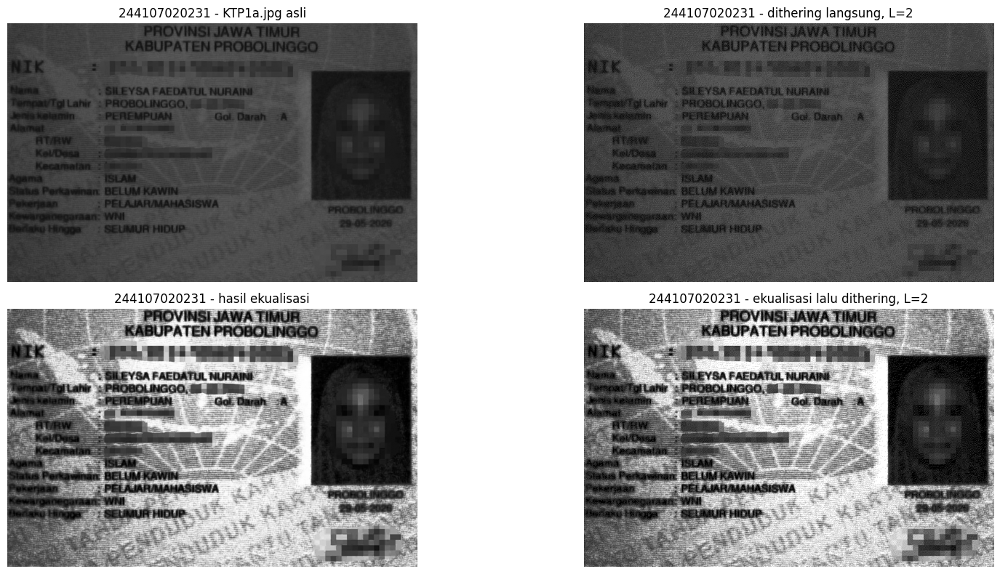

In [127]:
# ============================================
# E-3 NOMOR 2 - KTP1a.jpg
# ============================================

# --------------------------------------------
# Baca KTP1a.jpg sebagai grayscale
# --------------------------------------------

ktp = cv.imread(
    BASE + '/KTP1a.jpg',
    cv.IMREAD_GRAYSCALE
)

if ktp is None:
    raise FileNotFoundError(
        'File KTP1a.jpg tidak ditemukan di folder BASE'
    )


# --------------------------------------------
# Dithering langsung
# --------------------------------------------

ktp_dither = floyd_steinberg_gray(
    ktp,
    levels=PARAM['L']
)


# --------------------------------------------
# Histogram Equalization
# --------------------------------------------

ktp_eq = cv.equalizeHist(ktp)


# --------------------------------------------
# Equalization lalu Dithering
# --------------------------------------------

ktp_eq_dither = floyd_steinberg_gray(
    ktp_eq,
    levels=PARAM['L']
)


# ============================================
# TAMPILKAN HASIL
# ============================================

fig = plt.figure(figsize=(16, 8))


# --------------------------------------------
# 1. KTP1a asli
# --------------------------------------------

ax1 = plt.subplot2grid(
    (2, 4),
    (0, 0),
    colspan=2
)

ax1.imshow(
    ktp,
    cmap='gray',
    vmin=0,
    vmax=255
)

ax1.set_title(
    NIM + ' - KTP1a.jpg asli'
)

ax1.axis('off')


# --------------------------------------------
# 2. Dithering langsung
# --------------------------------------------

ax2 = plt.subplot2grid(
    (2, 4),
    (0, 2),
    colspan=2
)

ax2.imshow(
    ktp_dither,
    cmap='gray',
    vmin=0,
    vmax=255
)

ax2.set_title(
    NIM + ' - dithering langsung, '
    + f'L={PARAM["L"]}'
)

ax2.axis('off')


# --------------------------------------------
# 3. Hasil ekualisasi
# --------------------------------------------

ax3 = plt.subplot2grid(
    (2, 4),
    (1, 0),
    colspan=2
)

ax3.imshow(
    ktp_eq,
    cmap='gray',
    vmin=0,
    vmax=255
)

ax3.set_title(
    NIM + ' - hasil ekualisasi'
)

ax3.axis('off')


# --------------------------------------------
# 4. Ekualisasi lalu dithering
# --------------------------------------------

ax4 = plt.subplot2grid(
    (2, 4),
    (1, 2),
    colspan=2
)

ax4.imshow(
    ktp_eq_dither,
    cmap='gray',
    vmin=0,
    vmax=255
)

ax4.set_title(
    NIM + ' - ekualisasi lalu dithering, '
    + f'L={PARAM["L"]}'
)

ax4.axis('off')


plt.tight_layout()
plt.show()

Berdasarkan hasil percobaan, urutan ekualisasi histogram kemudian dithering Floyd-Steinberg menghasilkan teks pada KTP yang lebih terbaca dibandingkan dithering yang dilakukan secara langsung. Hal ini terjadi karena histogram equalization terlebih dahulu meningkatkan kontras citra, sehingga perbedaan intensitas antara teks dan latar belakang menjadi lebih jelas. Setelah dilakukan dithering dengan L = 2, informasi teks tetap memiliki batas yang lebih tegas. Pada dithering langsung, citra yang masih memiliki kontras rendah menghasilkan teks yang relatif kurang jelas. Dengan demikian, pada citra KTP1a.jpg, urutan yang lebih baik untuk keterbacaan teks adalah histogram equalization → Floyd-Steinberg dithering. Jadi, Ekualisasi → Dithering lebih terbaca daripada Dithering langsung.